# stSME clustering tutorial

**stSME** is a novel normalisation method implemented in *stLearn* software.   
It's designed for **s**patial **t**ranscriptomics data and utilised tissue **S**patial location, **M**orphology, , and gene **E**xpression.

This tutorial demonstrates how to use *stLearn* to perform **stSME** clustering for spatial transcriptomics data

In this tutorial we first focus on **Mouse Brain (Coronal)** Visium dataset from [10x genomics website](https://support.10xgenomics.com/spatial-gene-expression/datasets/1.0.0/V1_Adult_Mouse_Brain).

## Mouse Brain (Coronal)

### 1. Preparation

In [1]:
# import module
import stlearn as st
from pathlib import Path

In [2]:
# specify PATH to data
BASE_PATH = Path("/90days/uqxtan9/10x_Visium/V1_Adult_Mouse_Brain")

# spot tile is the intermediate result of image pre-processing
TILE_PATH = BASE_PATH / "tiles"

In [3]:
# load data
data = st.Read10X(BASE_PATH)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
# pre-processing for gene count table
st.pp.filter_genes(data,min_cells=3)
st.pp.normalize_total(data)
st.pp.log1p(data)
st.pp.scale(data)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


In [5]:
# pre-processing for spot image
st.pp.tiling(data, TILE_PATH, crop_size=40)

# this step uses deep learning model to extract high-level features from tile images
# may need few minutes to be completed
st.pp.extract_feature(data)

Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!


### 2. run stSME clustering

In [6]:
# run PCA for gene expression data
st.em.run_pca(data,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [7]:
# apply stMLE to normalise PCA
# radius=50 includes two units of surrounding spots
st.spatial.morphology.adjust(data,use_data="X_pca",radius=50,method="mean")
data.obsm['X_pca'] = data.obsm['X_pca_morphology']

Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']


Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


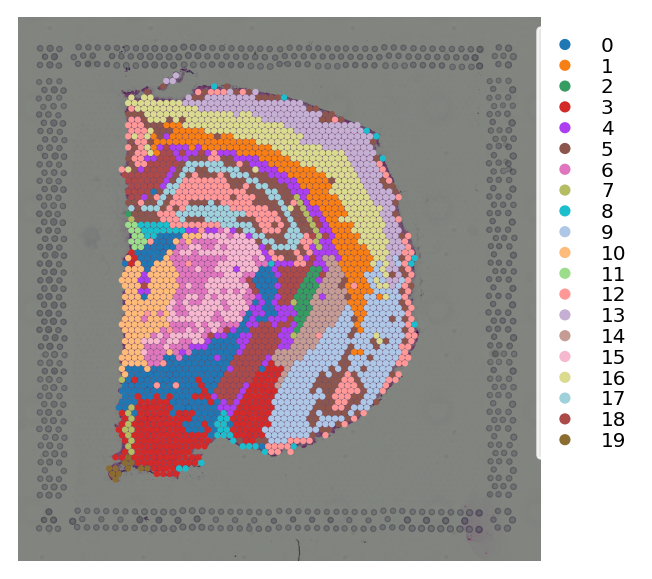

In [8]:
# K-means clustering on stMLE normalised PCA
st.tl.clustering.kmeans(data,n_clusters=20, use_data="X_pca", key_added="X_pca_kmeans")
st.pl.cluster_plot(data, use_label="X_pca_kmeans")

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


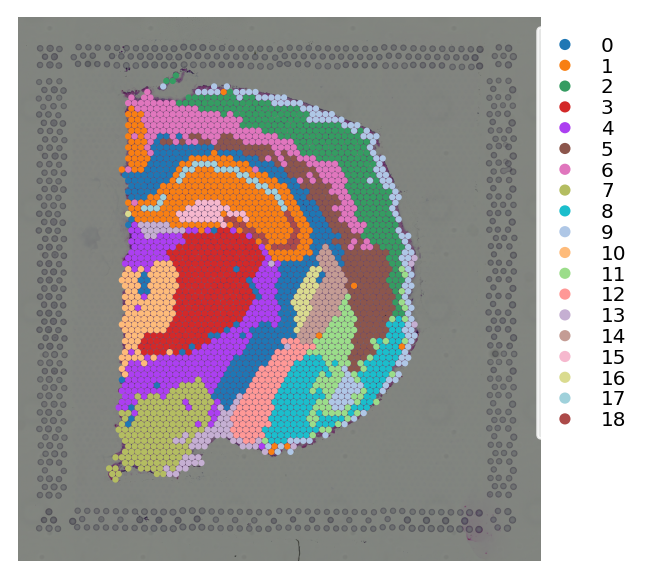

In [9]:
# louvain clustering on stMLE normalised PCA
st.pp.neighbors(data,n_neighbors=10,use_rep='X_pca')
st.tl.clustering.louvain(data)
st.pl.cluster_plot(data,use_label="louvain")

we now move to Mouse Brain (Sagittal Posterior) Visium dataset from [10x genomics website](https://support.10xgenomics.com/spatial-gene-expression/datasets/1.0.0/V1_Mouse_Brain_Sagittal_Posterior).

## Mouse Brain (Sagittal Posterior)

### 1. Preparation

In [10]:
# specify PATH to data
BASE_PATH = Path("/90days/uqxtan9/10x_Visium/V1_Mouse_Brain_Sagittal_Posterior")

# spot tile is the intermediate result of image pre-processing
TILE_PATH = BASE_PATH / "tiles"

In [11]:
# load data
data = st.Read10X(BASE_PATH)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
# pre-processing for gene count table
st.pp.filter_genes(data,min_cells=3)
st.pp.normalize_total(data)
st.pp.log1p(data)
st.pp.scale(data)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


In [13]:
# pre-processing for spot image
st.pp.tiling(data, TILE_PATH, crop_size=40)

# this step uses deep learning model to extract high-level features from tile images
# may need few minutes to be completed
st.pp.extract_feature(data)

Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


### 2. run stSME clustering

In [14]:
# run PCA for gene expression data
st.em.run_pca(data,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [15]:
# apply stMLE to normalise PCA
# radius=50 includes two units of surrounding spots
st.spatial.morphology.adjust(data,use_data="X_pca",radius=50,method="mean")
data.obsm['X_pca'] = data.obsm['X_pca_morphology']

Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']


Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


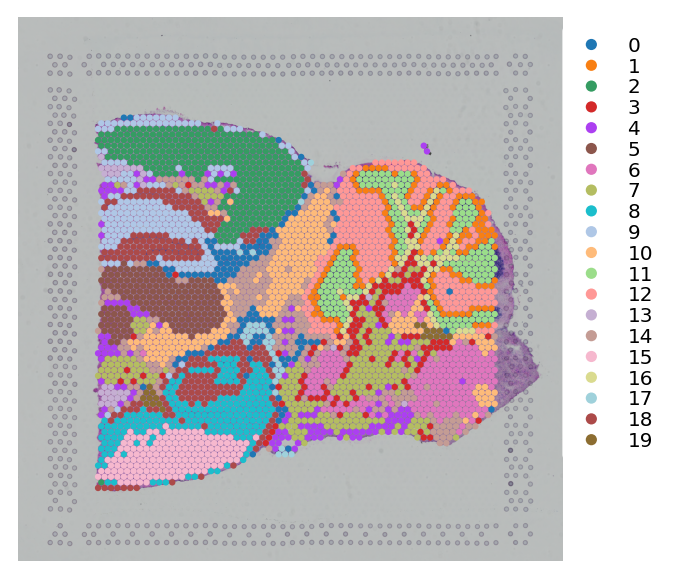

In [16]:
# K-means clustering on stMLE normalised PCA
st.tl.clustering.kmeans(data,n_clusters=20, use_data="X_pca", key_added="X_pca_kmeans")
st.pl.cluster_plot(data, use_label="X_pca_kmeans")

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
Applying Louvain clustering ...
Louvain clustering is done! The labels are stored in adata.obs['louvain']


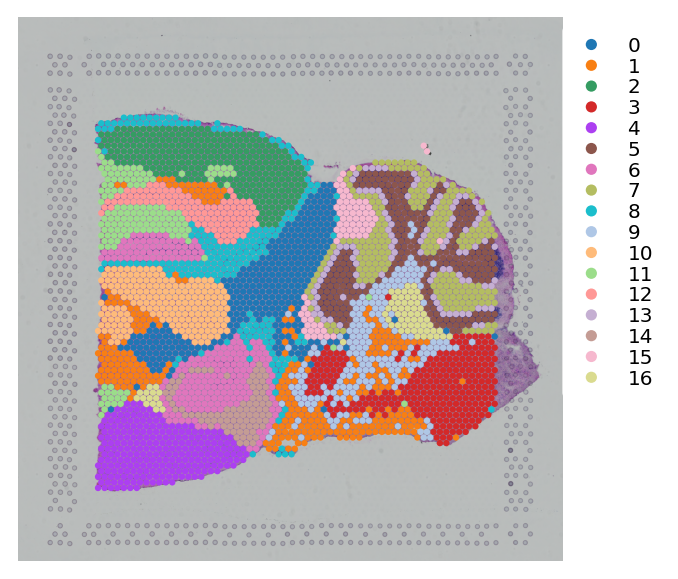

In [17]:
# louvain clustering on stMLE normalised PCA
st.pp.neighbors(data,n_neighbors=15,use_rep='X_pca')
st.tl.clustering.louvain(data)
st.pl.cluster_plot(data,use_label="louvain")

Then we apply stSME clustering on Human Brain dorsolateral prefrontal cortex (DLPFC) Visium dataset from this [paper](https://www.biorxiv.org/content/10.1101/2020.02.28.969931v1).

##  Human Brain dorsolateral prefrontal cortex (DLPFC)

In [18]:
import pandas as pd
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import scanpy 

In [19]:
# specify PATH to data
BASE_PATH = Path("/90days/uqxtan9/Human_Brain_spatialLIBD")
MARKER_GENE_PATH = BASE_PATH / "marker_gene.tsv"

In [20]:
# here we include all 12 samples
sample_list = ["151507", "151508", "151509",
               "151510", "151669", "151670",
               "151671", "151672", "151673",
               "151674", "151675", "151676"]

In [21]:
df = pd.DataFrame(columns=['Sample', 'Adjusted_Rand_Score', 'PCA_or_UMAP', 'Method'])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


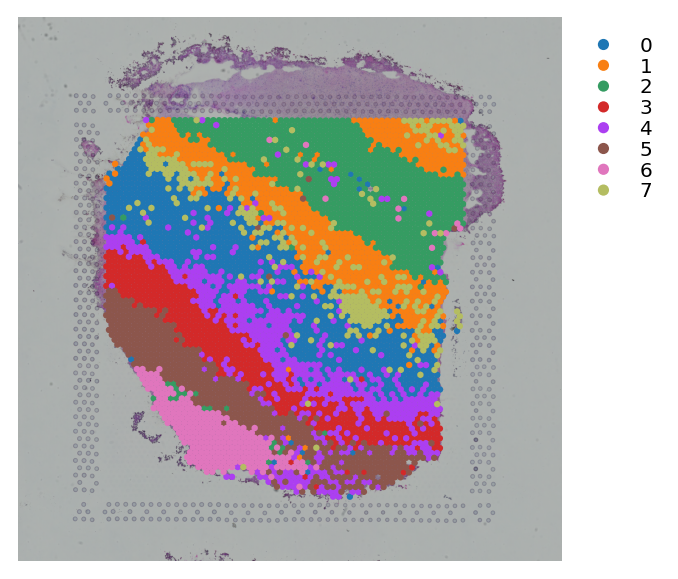

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


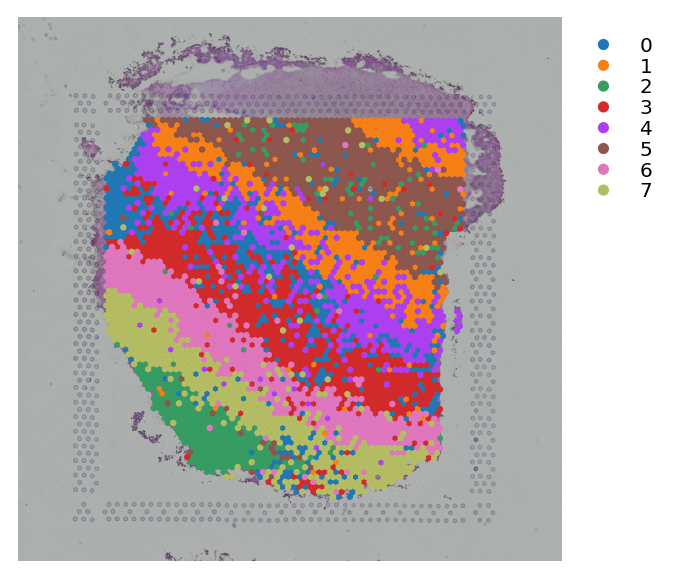

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


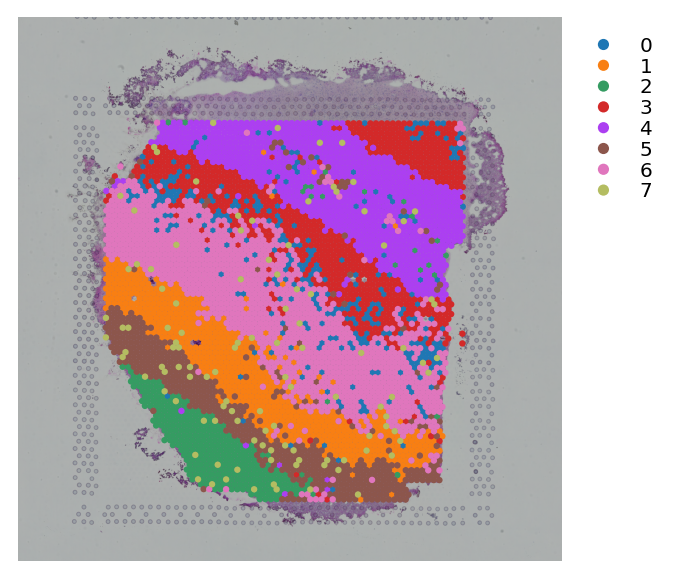

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


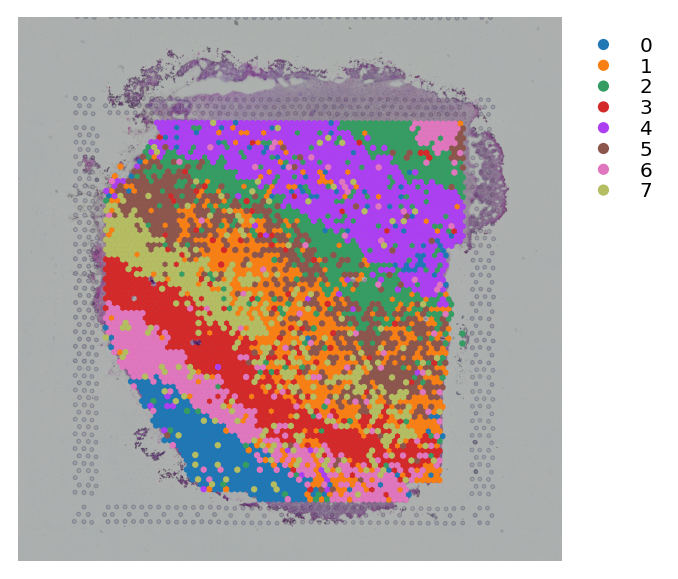

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


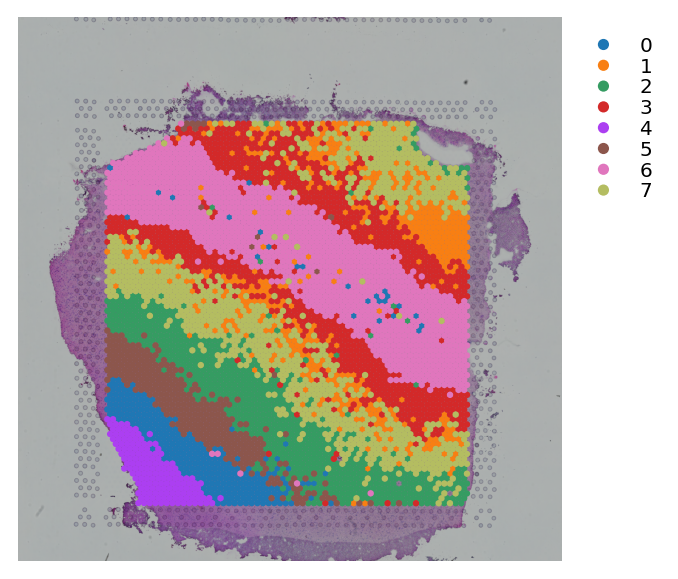

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


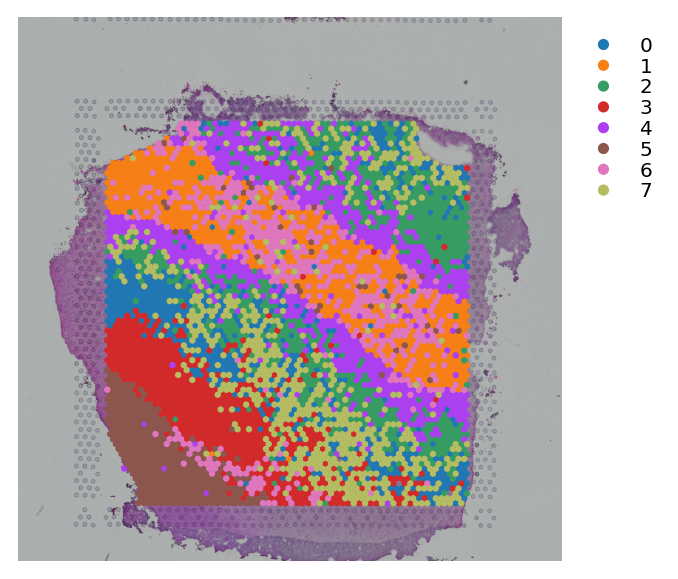

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]  


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


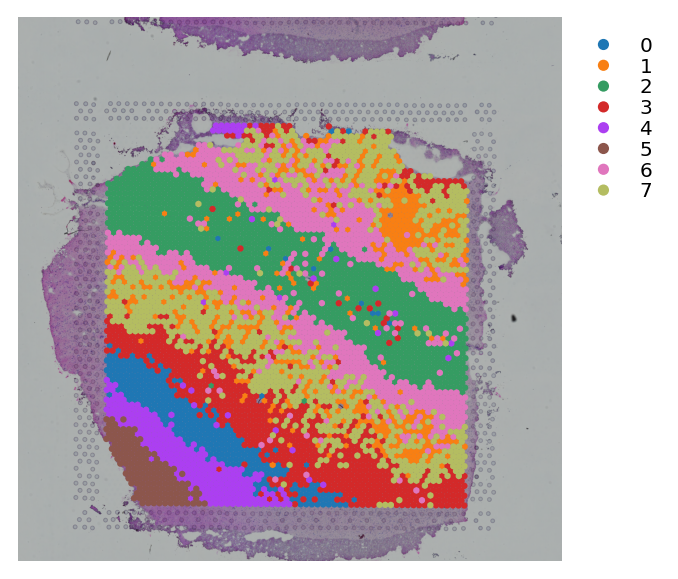

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


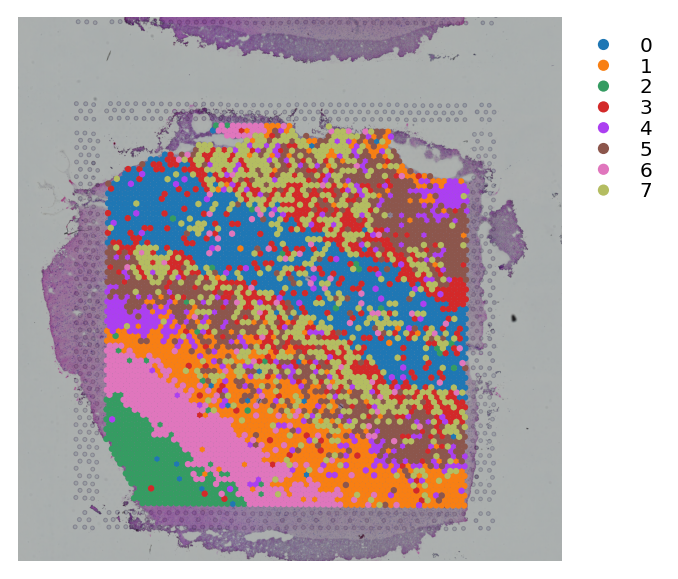

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


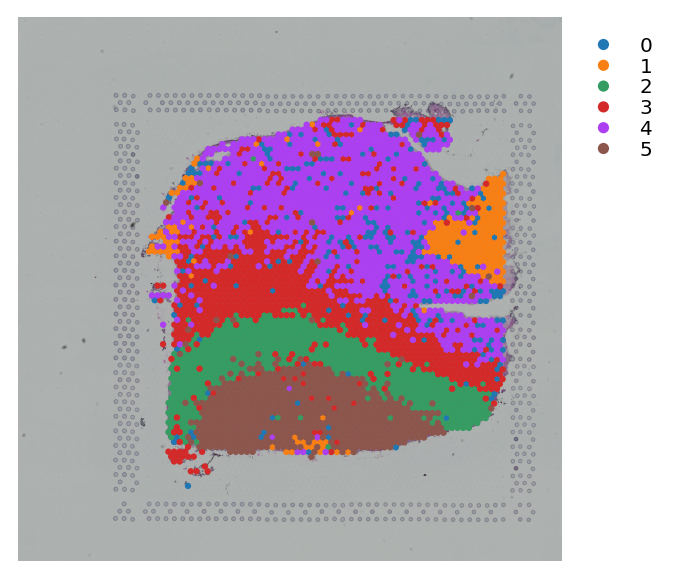

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


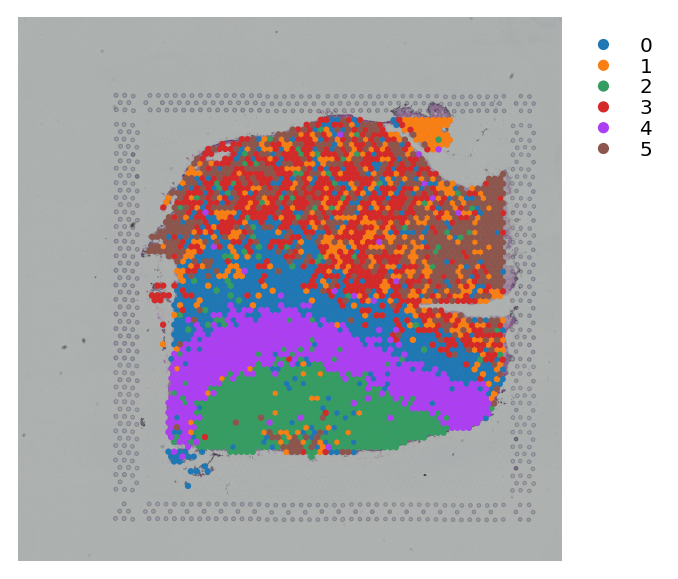

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


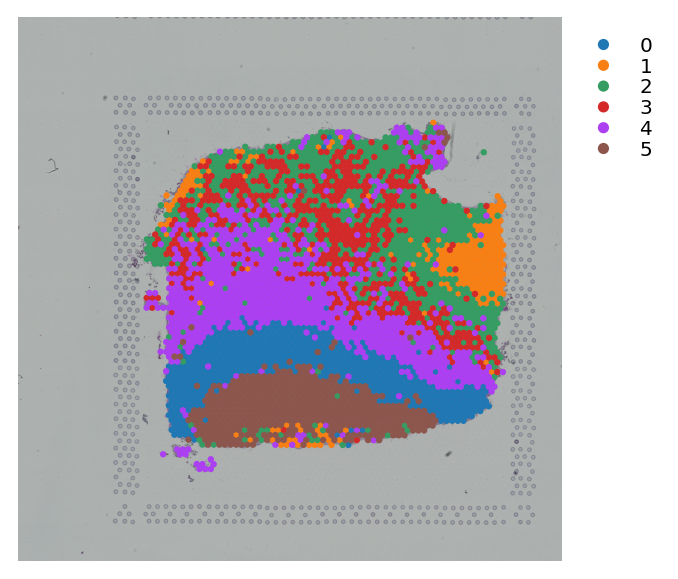

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


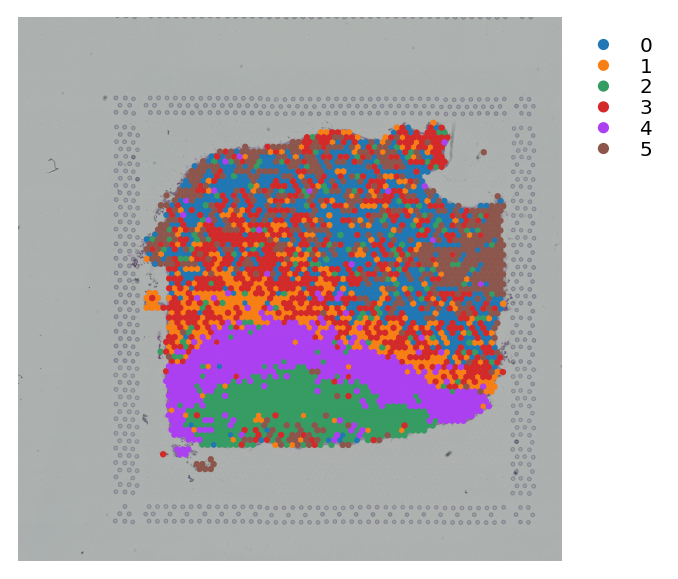

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


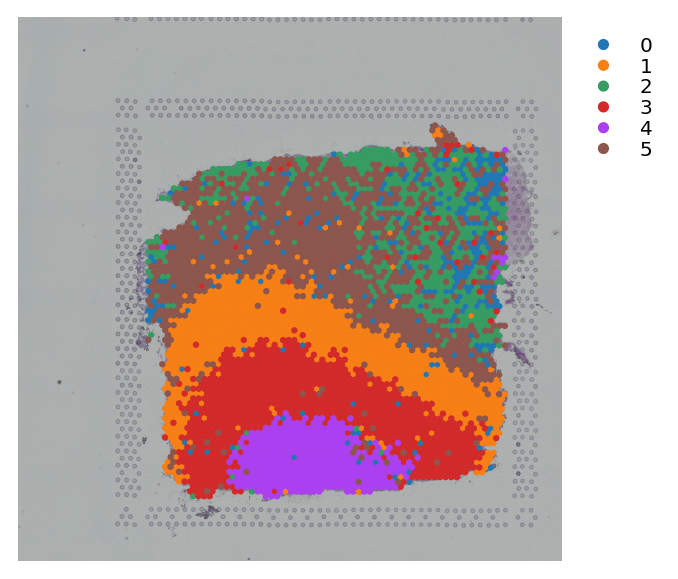

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


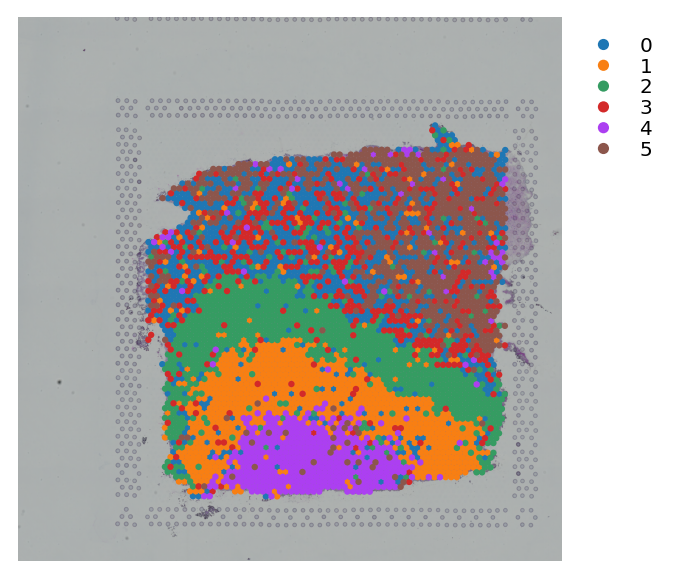

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


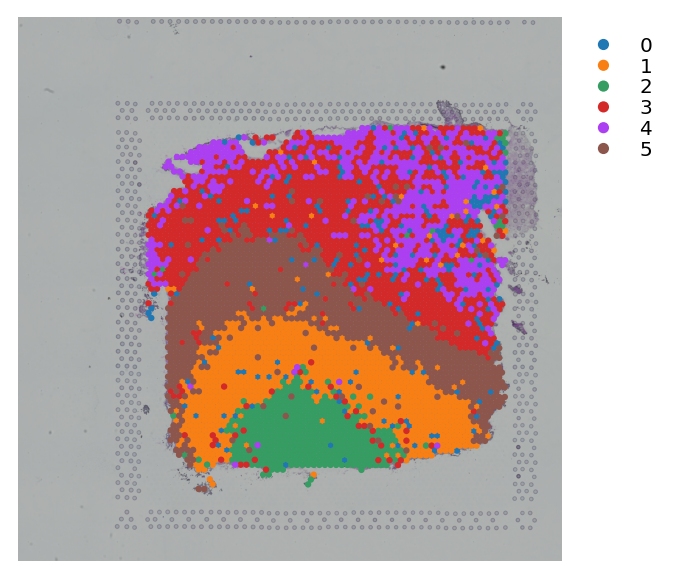

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


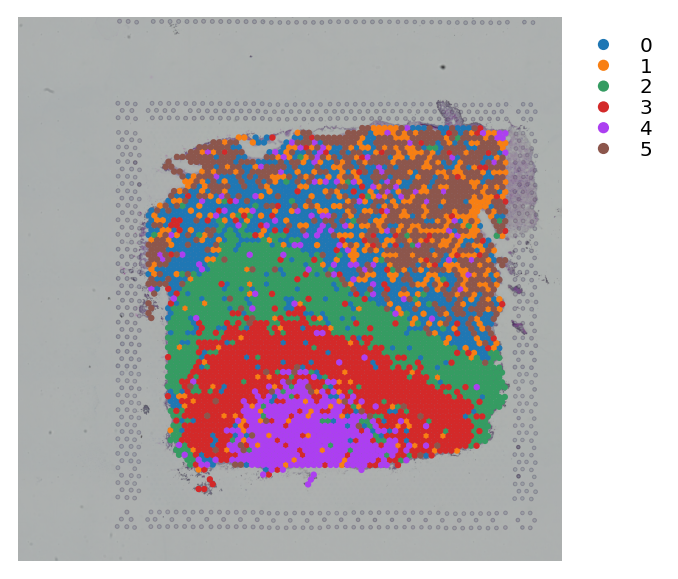

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


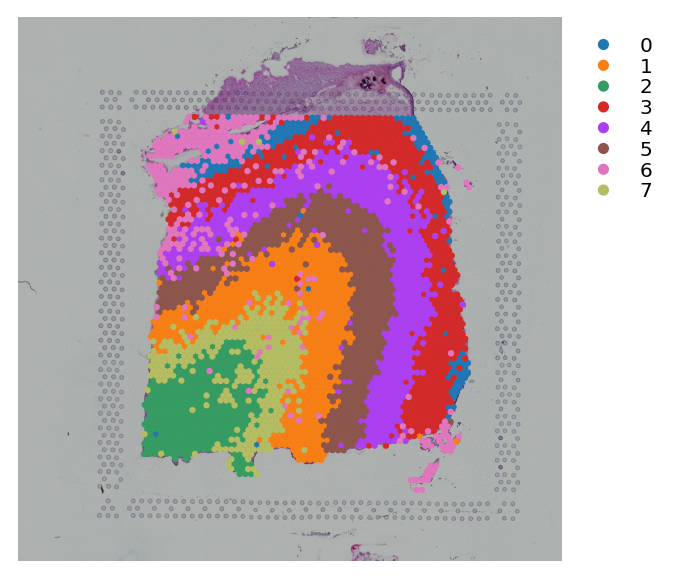

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


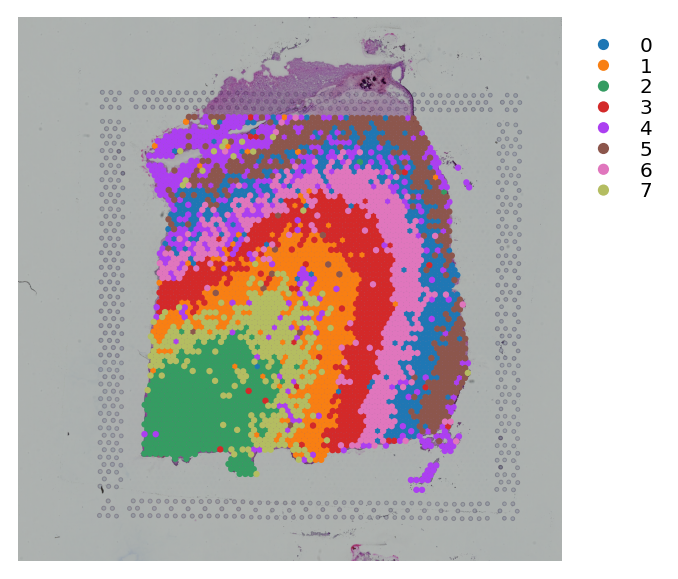

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


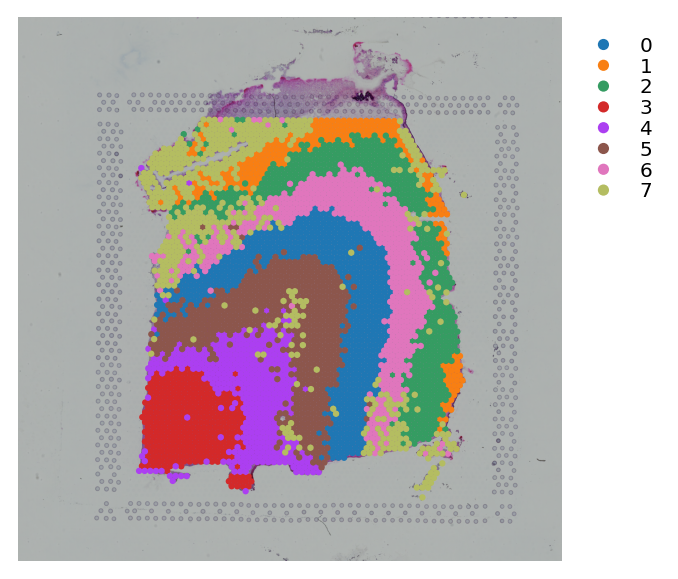

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


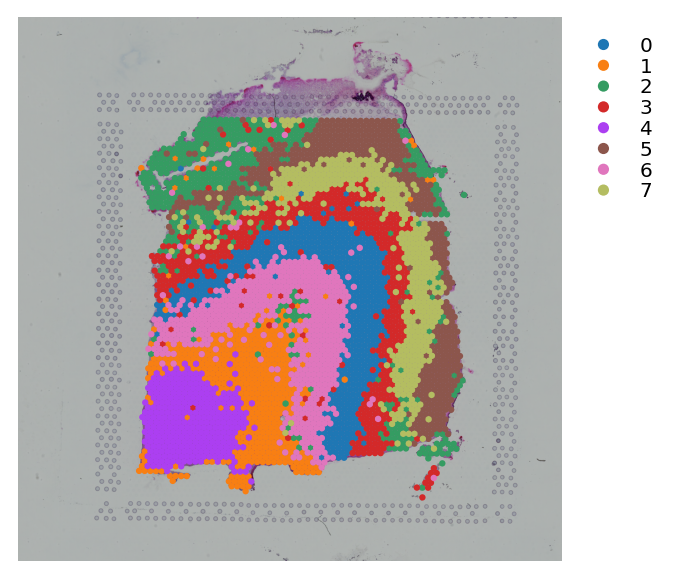

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


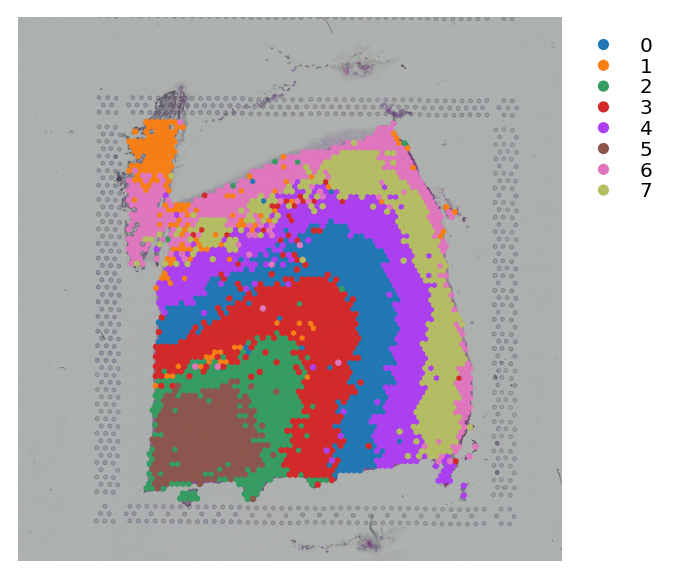

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


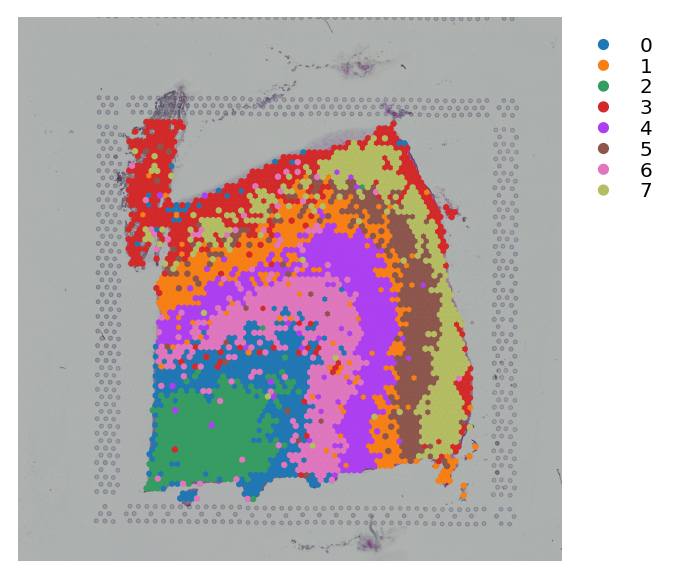

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Normalization step is finished in adata.X
Log transformation step is finished in adata.X
Scale step is finished in adata.X


Tiling image: 100%|██████████ [ time left: 00:00 ]
Extract feature: 100%|██████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Adjusting data: 100%|██████████ [ time left: 00:00 ]


The data adjusted by morphology is added to adata.obsm['X_pca_morphology']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


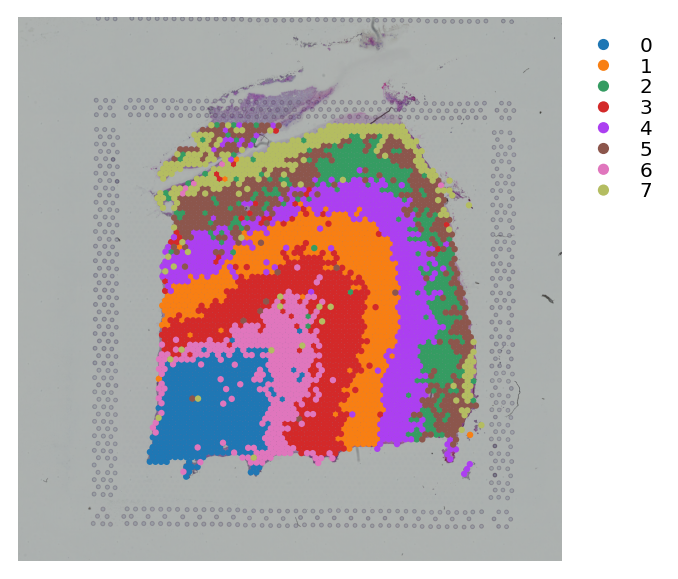

Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 
UMAP is done! Generated in adata.obsm['X_umap'] nad adata.uns['umap']
Applying Kmeans clustering ...
Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


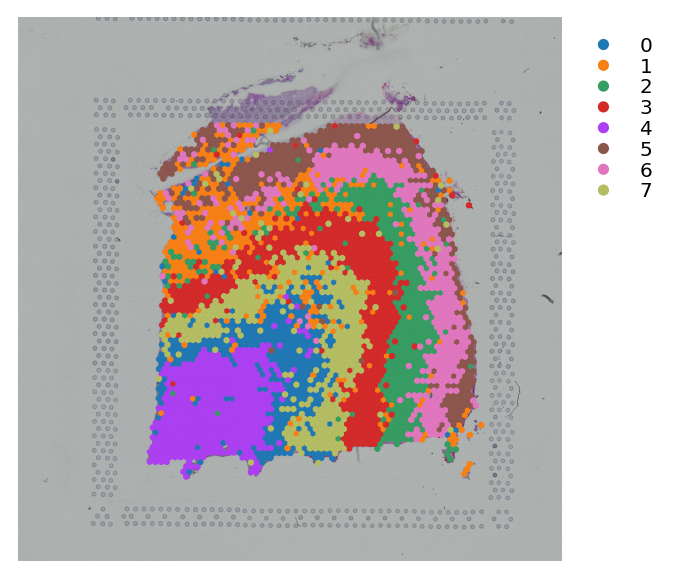

In [22]:
for i in range(len(sample_list)):
    sample = sample_list[i]
    TILE_PATH = BASE_PATH / "{}_tiles".format(sample)
    TILE_PATH.mkdir(parents=True, exist_ok=True)
    
    marker_gene_df = pd.read_csv(MARKER_GENE_PATH, sep='\t')
    marker_gene = [i.upper() for i in marker_gene_df["symbol"].to_list()]
    
    GROUND_TRUTH_PATH = BASE_PATH / sample / "cluster_labels_{}.csv".format(sample)
    ground_truth_df = pd.read_csv(GROUND_TRUTH_PATH, sep=',', index_col=0)
    ground_truth_df.index = ground_truth_df.index.map(lambda x: x[7:])
    
    le = LabelEncoder()
    ground_truth_le = le.fit_transform(list(ground_truth_df["ground_truth"].values))
    ground_truth_df["ground_truth_le"] = ground_truth_le
    selected_columns = ground_truth_df.columns[1:-1]
    ground_truth_df_select = ground_truth_df[selected_columns]
    ari_ref = ground_truth_df_select.apply(lambda x : adjusted_rand_score(x, ground_truth_df["ground_truth_le"]), axis=0)
    for item in ari_ref.iteritems():
        method, ari_score = item
        pca_or_umap = "pca" if "PCA" in method else "umap"
        method = method.replace("_PCA", '')
        method = method.replace("_UMAP", '')
        df = df.append(pd.Series([sample, ari_score, pca_or_umap, method], 
                       index=['Sample', 'Adjusted_Rand_Score', 'PCA_or_UMAP', 'Method']), ignore_index=True)
    
    
    # load data
    data = st.Read10X(BASE_PATH / sample)
    data = data[:, marker_gene]
    ground_truth_df = ground_truth_df.reindex(data.obs_names)
    n_cluster = len((set(ground_truth_df["ground_truth"])))
    data.obs['ground_truth'] = ground_truth_df["ground_truth"]
    
    # pre-processing for gene count table
    st.pp.filter_genes(data,min_cells=1)
    st.pp.normalize_total(data)
    st.pp.log1p(data)
    st.pp.scale(data)
    
    # pre-processing for spot image
    st.pp.tiling(data, TILE_PATH, crop_size=40)

    # this step uses deep learning model to extract high-level features from tile images
    # may need few minutes to be completed
    st.pp.extract_feature(data)
    
    # run PCA for gene expression data
    st.em.run_pca(data,n_comps=50)
    
    # apply stMLE to normalise PCA
    # radius=90 includes three units of surrounding spots
    st.spatial.morphology.adjust(data, use_data="X_pca", radius=90, method="mean", 
                                 similarity_matrix="cosine", rates=5)
    data.obsm['X_pca'] = data.obsm['X_pca_morphology']
    
    # K-means clustering on stMLE normalised PCA
    st.tl.clustering.kmeans(data,n_clusters=n_cluster, use_data="X_pca", key_added="X_pca_kmeans")
    st.pl.cluster_plot(data, use_label="X_pca_kmeans")
    
    # K-means clustering on stMLE normalised umap
    st.pp.neighbors(data,n_neighbors=5)
    st.em.run_umap(data)
    st.tl.clustering.kmeans(data, n_clusters=n_cluster, use_data="X_umap", key_added="X_umap_kmeans")
    st.pl.cluster_plot(data, use_label="X_umap_kmeans")

    pca_ari = adjusted_rand_score(ground_truth_le, data.obs["X_pca_kmeans"])
    df = df.append(pd.Series([sample, pca_ari, "pca", "stSME"],
                             index=['Sample', 'Adjusted_Rand_Score', 'PCA_or_UMAP', 'Method']), ignore_index=True)

    umap_ari = adjusted_rand_score(ground_truth_le, data.obs["X_umap_kmeans"])
    df = df.append(pd.Series([sample, umap_ari, "umap", "stSME"],
                             index=['Sample', 'Adjusted_Rand_Score', 'PCA_or_UMAP', 'Method']), ignore_index=True)

In [23]:
df["Method_Group"] = df["PCA_or_UMAP"] + "_" + df["Method"]

In [24]:
method_group = list(set(df["Method_Group"]))
method_group_values =[]
for i in method_group:
    method_group_values.append(list(df.loc[df["Method_Group"] == i, "Adjusted_Rand_Score"]))
method_group_values = np.array(method_group_values)

In [25]:
import statsmodels.api as sa
import statsmodels.formula.api as sfa
import scikit_posthocs as sp

In [26]:
lm = sfa.ols('Adjusted_Rand_Score ~ C(Method_Group)', data=df).fit()

In [27]:
anova = sa.stats.anova_lm(lm)
anova

,df,sum_sq,mean_sq,F,PR(>F)
C(Method_Group),21.0,2.615436,0.124545,40.778467,2.519522e-67
Residual,242.0,0.739110,0.003054,NaN,NaN


In [28]:
pca_df = df.loc[df["PCA_or_UMAP"]=="pca",:]
pca_posthoc = sp.posthoc_ttest(pca_df, val_col='Adjusted_Rand_Score', group_col='Method_Group', p_adjust='holm')

In [29]:
umap_df = df.loc[df["PCA_or_UMAP"]=="umap",:]
umap_posthoc = sp.posthoc_ttest(umap_df, val_col='Adjusted_Rand_Score', group_col='Method_Group', p_adjust='holm')

In [30]:
%matplotlib inline
import seaborn as sns, matplotlib.pyplot as plt
plt.rcParams["legend.loc"] = 'upper left'
sns.set(style="whitegrid", palette="pastel", color_codes=True)
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_context("paper", font_scale=2)  

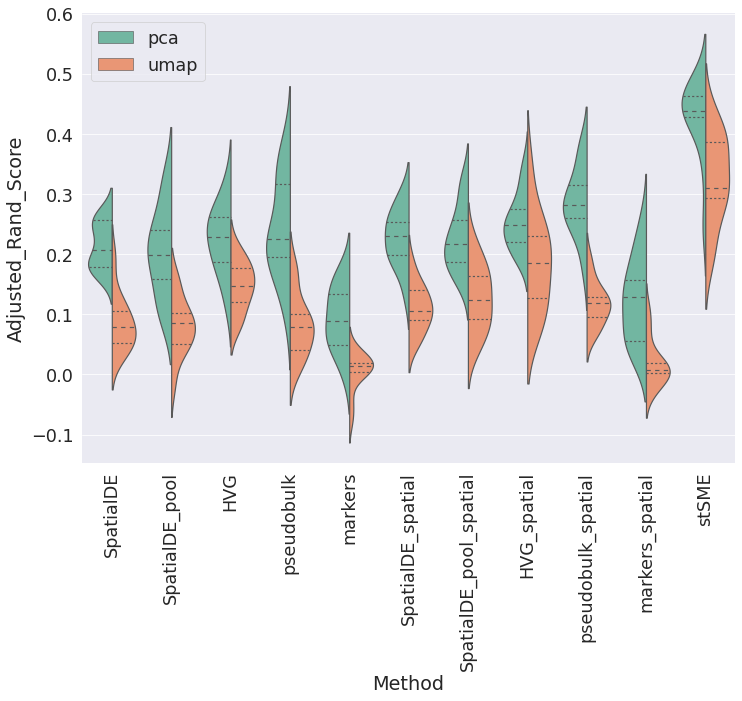

In [31]:
a = sns.violinplot(x="Method", y="Adjusted_Rand_Score", hue="PCA_or_UMAP",
               split=True, inner="quartile", scale="count",
               palette="Set2",
               data=df)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
sns.despine(left=True)
a.legend(loc=2)
# plt.savefig(BASE_PATH / "Adjusted_Rand_Score.png", dpi=300)

In [32]:
mask = np.zeros_like(pca_posthoc)
mask[np.triu_indices_from(mask)] = True

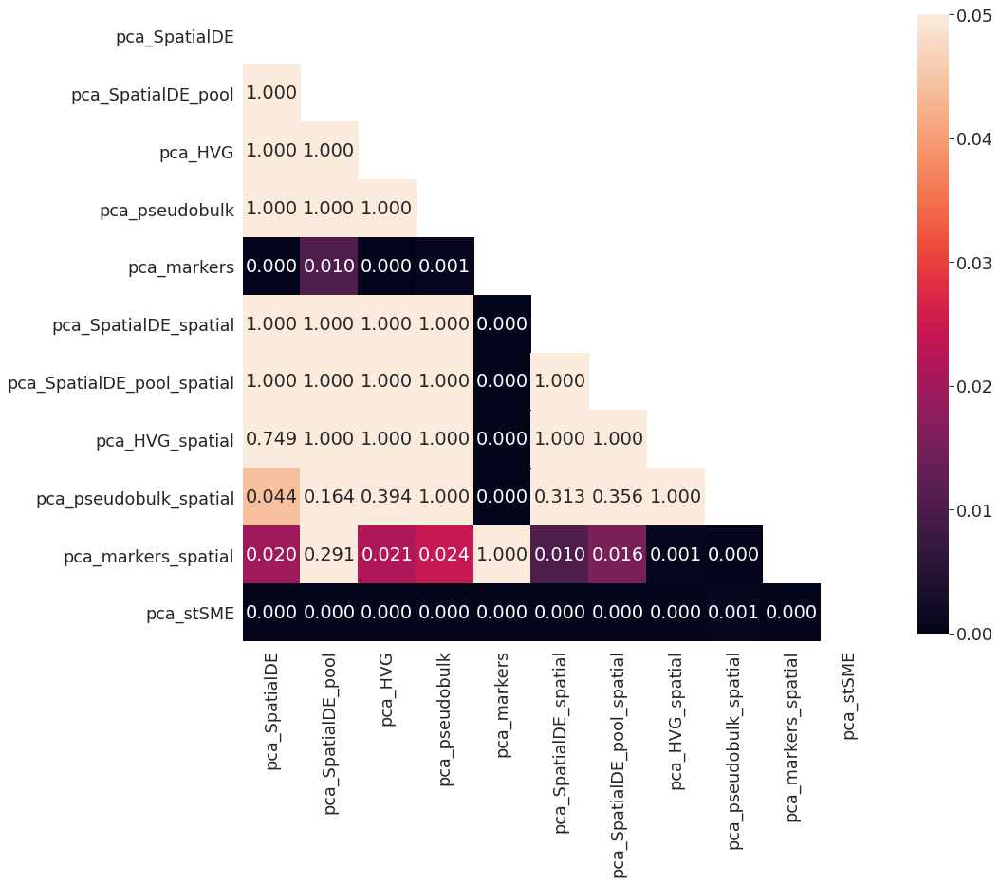

In [33]:
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 15))
    ax = sns.heatmap(pca_posthoc, mask=mask, vmax=0.05, vmin=0, square=True, annot=True, fmt=".3f",
                     cbar_kws={"shrink": 0.8})

In [34]:
mask = np.zeros_like(umap_posthoc)
mask[np.triu_indices_from(mask)] = True

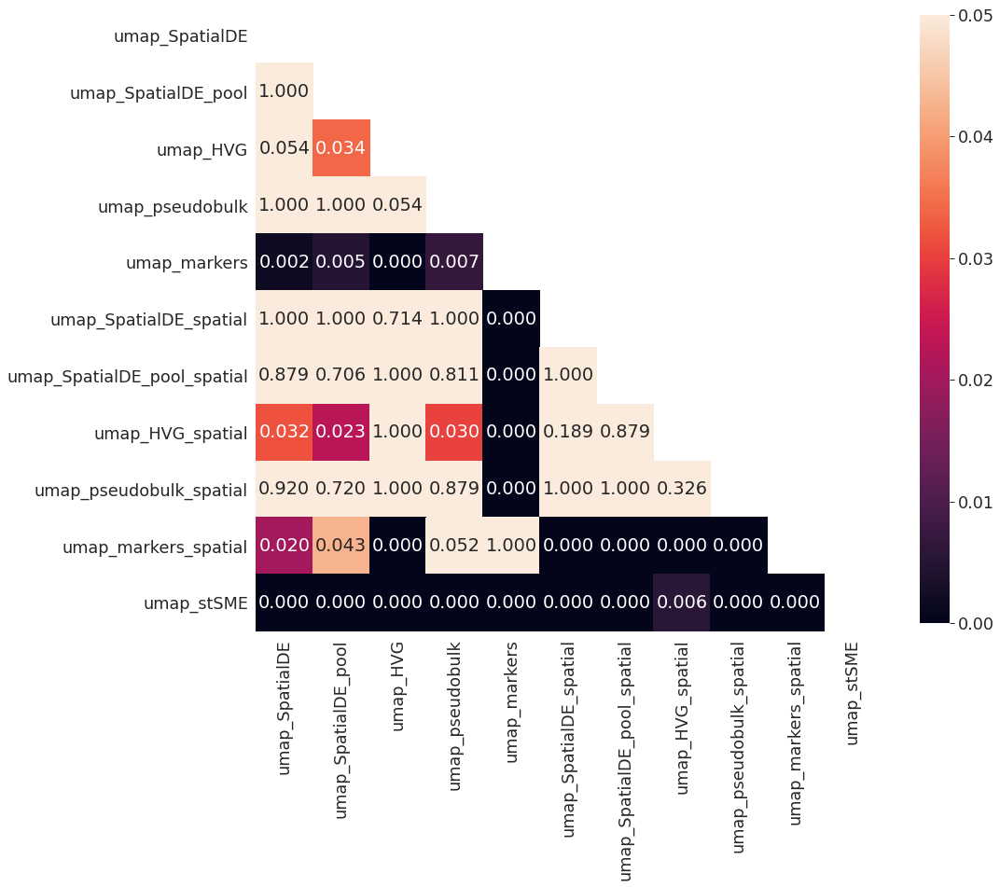

In [35]:
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 15))
    ax = sns.heatmap(umap_posthoc, mask=mask, vmax=0.05, vmin=0, square=True, annot=True, fmt=".3f",
                     cbar_kws={"shrink": 0.8})